### Libraries Import

In [1]:
import torch
import torch.nn as nn

## Net definition

In [2]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(196608,50)
        self.fc2 = nn.Linear(50,2)
        
    def forward(self, x):
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.fc2(x)
        return x

In [3]:
net = Net()

#### Count parameters

In [4]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [5]:
count_parameters(net)

9830552

## Input image

In [6]:
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms

#### DataLoader

In [7]:
transform = transforms.Compose([transforms.ToTensor(),transforms.Lambda(lambda x: x.flatten())])
image_folder = dset.ImageFolder("chihuahua-vs-muffin/processed_data/train/", transform)
train_loader = torch.utils.data.DataLoader(image_folder,batch_size = 4,shuffle = True, num_workers=8)

#### Batch generation

In [8]:
dataiter = iter(train_loader)
images, labels = dataiter.next()

In [9]:
images.shape

torch.Size([4, 196608])

#### Images visualisation

In [10]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.style.use('dark_background')

In [11]:
def imshow(img,figsize=(15,9)):
    npimg = img.numpy()
    plt.figure(figsize=figsize)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

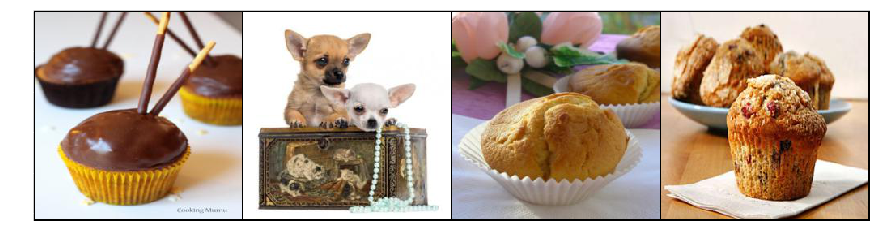

In [12]:
imshow(torchvision.utils.make_grid(images.reshape([4,3,256,256])))

In [13]:
classes=('chihuahua','muffin')
print('Classes :' + ' '.join('%5s' % classes[labels[j]] for j in range(4)))

Classes :muffin chihuahua muffin muffin


### Make prediction

In [14]:
outputs = net(images)

#### Check prediction

In [15]:
_, predicted = torch.max(outputs.data, 1)
print('Prediction: ', ' '.join('%5s' % classes[predicted[j]] for j in range(4)))

Prediction:  muffin chihuahua chihuahua muffin


## Train the model

#### Define a Loss

In [16]:
criterion = nn.CrossEntropyLoss()

#### Define an Optimizer

In [17]:
import torch.optim as optim
optimizer = optim.Adam(net.parameters(), lr=0.0001, betas=(0.9, 0.999))

#### Init Loader

In [18]:
batch_size = 32
transform = transforms.Compose([transforms.ToTensor(),transforms.Lambda(lambda x: x.flatten())])
trainloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/train/", transform), batch_size = batch_size ,shuffle = True, num_workers=8)

#### Define a training Loop

In [19]:
%%time
# Loop over each batch
for i, data in enumerate(trainloader):
    # get the inputs
    inputs, labels = data
    
    # zero the parameter gradients
    optimizer.zero_grad()

    # forward + backward + optimize
    outputs = net(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

CPU times: user 4.94 s, sys: 695 ms, total: 5.64 s
Wall time: 1.82 s


#### Mesuring performances

In [20]:
correct = 0
total = 0
with torch.no_grad():
    for data in trainloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the images: %f %%' % (100*float(correct) / total))

Accuracy of the network on the images: 79.500891 %


#### validation dataset

In [21]:
validation_loader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/validation/", transform),batch_size=batch_size,shuffle=True)

In [22]:
correct = 0
total = 0
with torch.no_grad():
    for data in validation_loader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the images: %f %%' % (float(correct) / total))

Accuracy of the network on the images: 0.747826 %


## GPU

#### Model creation

In [23]:
device = torch.device("cuda:0")
cuda_net = Net().to(device)

#### Parameters 

In [24]:
for p in cuda_net.parameters():
    print(p.device, p.size())

cuda:0 torch.Size([50, 196608])
cuda:0 torch.Size([50])
cuda:0 torch.Size([2, 50])
cuda:0 torch.Size([2])


In [25]:
for p in net.parameters():
    print(p.device, p.size())

cpu torch.Size([50, 196608])
cpu torch.Size([50])
cpu torch.Size([2, 50])
cpu torch.Size([2])


#### Optimizer and loader

In [26]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cuda_net.parameters(), lr=0.00001, betas=(0.9, 0.999))
trainloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/train/", transform),batch_size = batch_size, shuffle = True, num_workers=8)

#### Training Loop

In [27]:
%%time
for i, data in enumerate(trainloader, 0):
    # get the inputs
    inputs, labels = data
    # zero the parameter gradients
    optimizer.zero_grad()
    # forward + backward + optimize
    outputs = cuda_net(inputs.to(device))
    loss = criterion(outputs, labels.to(device))
    loss.backward()
    optimizer.step()
    
print('Finished Training')

Finished Training
CPU times: user 323 ms, sys: 302 ms, total: 625 ms
Wall time: 884 ms


#### Training Loop - Several epochs

In [28]:
%%time
for epoch in range(10):
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs, labels = data
        
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = cuda_net(inputs.to(device))
        loss = criterion(outputs, labels.to(device))
        loss.backward()
        optimizer.step()

print('Finished Training')

Finished Training
CPU times: user 3.12 s, sys: 3.53 s, total: 6.66 s
Wall time: 8.93 s


#### Performance

In [29]:
correct = 0
total = 0
with torch.no_grad():
    for data in trainloader:
        images, labels = data
        outputs = cuda_net(images.to(device))
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels.to(device)).sum().item()

print(correct)
print(total)
print('Accuracy of the network on the 10000 test images: %f %%' % (100*float(correct) / total))

480
561
Accuracy of the network on the 10000 test images: 85.561497 %


#### Real performance

In [30]:
validationloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/validation/", transform),batch_size=batch_size,shuffle=True)
testloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/test/", transform),batch_size=batch_size,shuffle=True)

#### Validation dataset

In [31]:
correct = 0
total = 0

with torch.no_grad():
    for data in validationloader:
        images, labels = data
        outputs = cuda_net(images.to(device))
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels.to(device)).sum().item()

print(correct)
print(total)
print('Accuracy of the network on the validation images: %f %%' % (100*float(correct) / total))

92
115
Accuracy of the network on the validation images: 80.000000 %


#### Test dataset

In [32]:
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = cuda_net(images.to(device))
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels.to(device)).sum().item()

        
print(correct)
print(total)
print('Accuracy of the network on the 16 test images: %f %%' % (100*float(correct) / total))

7
16
Accuracy of the network on the 16 test images: 43.750000 %


    chihuahua   chihuahua   muffin   chihuahua   muffin   chihuahua   muffin   chihuahua   chihuahua   muffin   muffin   muffin   chihuahua   muffin   muffin   muffin


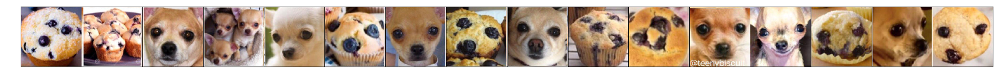

In [33]:
imshow(torchvision.utils.make_grid(images.reshape([16,3,256,256]),nrow=16),figsize=(28,15))
_, predicted = torch.max(outputs.data, 1)
print('   ', '   '.join('%5s' % classes[predicted[j]] for j in range(16)))

### Learning with Visdom

#### Import Lib

In [34]:
from torchnet.engine import Engine
from torchnet.logger import VisdomPlotLogger, VisdomLogger
import torchnet as tnt
import visdom

#### Visdom init

In [35]:
vis = visdom.Visdom()
vis.close(env="Chihuahua VS Muffin")
meter_loss = tnt.meter.AverageValueMeter()
classerr =  tnt.meter.ClassErrorMeter(accuracy=True)
confusion_meter = tnt.meter.ConfusionMeter(2)

loss_logger = VisdomPlotLogger('line', env = "Chihuahua VS Muffin", opts={'title': 'Loss'})
acc_logger = VisdomPlotLogger('line', env = "Chihuahua VS Muffin", opts={'title': 'Accuracy'})
confusion_logger = VisdomLogger('heatmap', env = "Chihuahua VS Muffin", opts={'title': 'Confusion matrix','columnnames': ['chihuahua','muffin'],'rownames': ['chihuahua','muffin']})

#### Epochs fonctions

In [36]:
def on_forward():
    meter_loss.add(loss.item())
    classerr.add(outputs.detach(), labels.to(device).detach())
    
def on_start_epoch():
    reset_meters()
    
def on_end_epoch(model,inputs_validation, labels_validation):
    loss_logger.log(epoch, meter_loss.value()[0],name='train')
    acc_logger.log(epoch, classerr.value()[0],name='train')
    
    classerr.reset()
    with torch.no_grad():
        outputs = model(inputs_validation.to(device))
        loss = criterion(outputs, labels_validation.to(device))
        classerr.add(outputs.detach(), labels_validation.to(device).detach())
        confusion_meter.add(outputs.detach(), labels_validation.to(device).detach())
        
    confusion_logger.log(confusion_meter.value())
    loss_logger.log(epoch, loss.item(),name='validation')
    acc_logger.log(epoch, classerr.value()[0],name='validation')
    
def reset_meters():
    meter_loss.reset()
    classerr.reset()
    confusion_meter.reset()

#### Init loader, optimizer, net

In [37]:
device = torch.device("cuda:0")
cuda_net = Net().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cuda_net.parameters(), lr=0.00001, betas=(0.9, 0.999))
trainloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/train/", transform),batch_size=batch_size,shuffle=True)
validationloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/validation/", transform),batch_size=128,shuffle=True)
testloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/test/", transform),batch_size=batch_size,shuffle=True)
iterator_validation = iter(validationloader)
inputs_validation, labels_validation = iterator_validation.next()

#### Learning Loop with epoch fonctions

In [38]:
nb_epochs = 100
for epoch in range(nb_epochs):
    on_start_epoch()
    for i, data in enumerate(trainloader, 0):
        
        inputs, labels = data
        optimizer.zero_grad()
        
        outputs = cuda_net(inputs.to(device))
        loss = criterion(outputs, labels.to(device))
        loss.backward()
        optimizer.step()
        on_forward()
        
    on_end_epoch(cuda_net,inputs_validation, labels_validation)

## Convolution

In [39]:
class ModelCNN(nn.Module):
    def __init__(self):
        super(ModelCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 4, (5, 5))
        self.conv2 = nn.Conv2d(4, 8, (5, 5))
        self.conv3 = nn.Conv2d(8, 12, (5, 5))
        self.conv4 = nn.Conv2d(12, 16, (5, 5))
        self.fc1 = nn.Linear(2304, 256)
        self.fc2 = nn.Linear(256, 2)

    def forward(self, input_):
        h1 = torch.relu(torch.nn.functional.max_pool2d(self.conv1(input_), 2))
        h2 = torch.relu(torch.nn.functional.max_pool2d(self.conv2(h1), 2))
        h3 = torch.relu(torch.nn.functional.max_pool2d(self.conv3(h2), 2))
        h4 = torch.relu(torch.nn.functional.adaptive_max_pool2d(self.conv4(h3), (12,12)))
        h4 = h4.view(-1, 2304)
        h5 = torch.relu(self.fc1(h4))
        h6 = self.fc2(h5)
        return h6

In [40]:
cnn_net = ModelCNN()

In [41]:
cnn_net

ModelCNN(
  (conv1): Conv2d(3, 4, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(4, 8, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(8, 12, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(12, 16, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=2304, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=2, bias=True)
)

#### Results

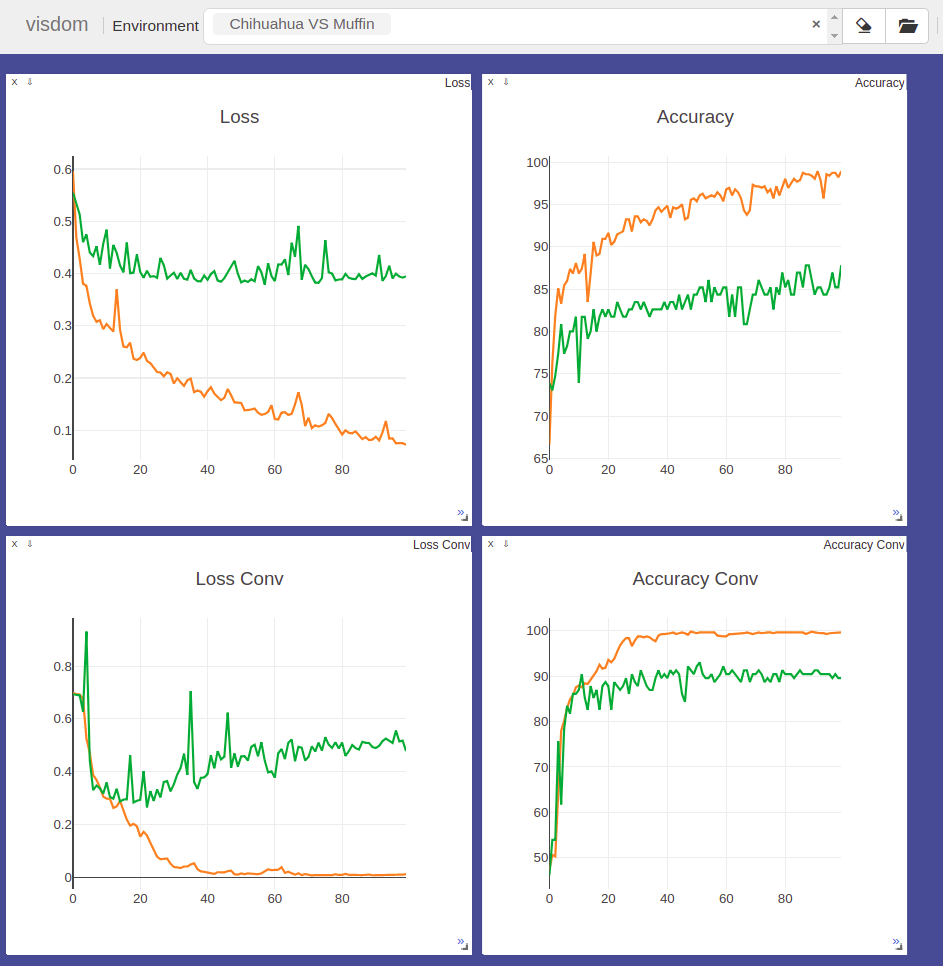

In [42]:
from IPython.display import Image
Image(filename = "Images/visdom.png")

## Features extractions

In [43]:
import numpy as np
def extraire_features_label_et_datas(loader):
    k=0
    for batch_idx, (data, target) in enumerate(loader):
        data = data.to(device)
        output = model_ft(data)
        array = output.detach().cpu().numpy()
        if k==0:
            features=array
            labels=target.numpy()
            datas=data.detach().cpu().numpy()
        else:
            features=np.concatenate((features,array),axis=0)
            labels=np.concatenate((labels,target.numpy()))
            datas=np.concatenate((datas,data.data.cpu().numpy()),axis=0)
        k=k+1
    features=np.reshape(features,(features.shape[0],features.shape[1]*features.shape[2]*features.shape[3]))
    datas=np.transpose(datas,(0,2,3,1))
    return features,labels,datas

#### Load VGG model

In [44]:
from torchvision import models
model_ft = models.vgg16(pretrained=True)

#### Get last Feature Map

In [45]:
model_ft = torch.nn.Sequential(*list(model_ft.children())[:-1])
model_ft = model_ft.to(device)

#### Count Parameters

In [46]:
count_parameters(model_ft)

14714688

#### Loaders

In [47]:
trainloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/train/", transforms.ToTensor()),batch_size=4,shuffle=True,num_workers=8)
validationloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/validation/", transforms.ToTensor()),batch_size=4,shuffle=True,num_workers=8)
testloader = torch.utils.data.DataLoader(dset.ImageFolder("chihuahua-vs-muffin/processed_data/test/", transforms.ToTensor()),batch_size=4,shuffle=True,num_workers=8)

#### Feature extraction

In [48]:
%%time
features_train, labels_train, datas_train = extraire_features_label_et_datas(trainloader)
features_validation, labels_validation, datas_validation = extraire_features_label_et_datas(validationloader)
features_test, labels_test, datas_test = extraire_features_label_et_datas(testloader)

CPU times: user 22.3 s, sys: 18.3 s, total: 40.6 s
Wall time: 41 s


### Feature visualisations

#### Libraries

In [49]:
import umap
from sklearn.manifold import TSNE
from utils.canvas_embedding import *

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


#### Umap

In [50]:
embed = umap.UMAP().fit_transform(features_train)

#### Scatter plot

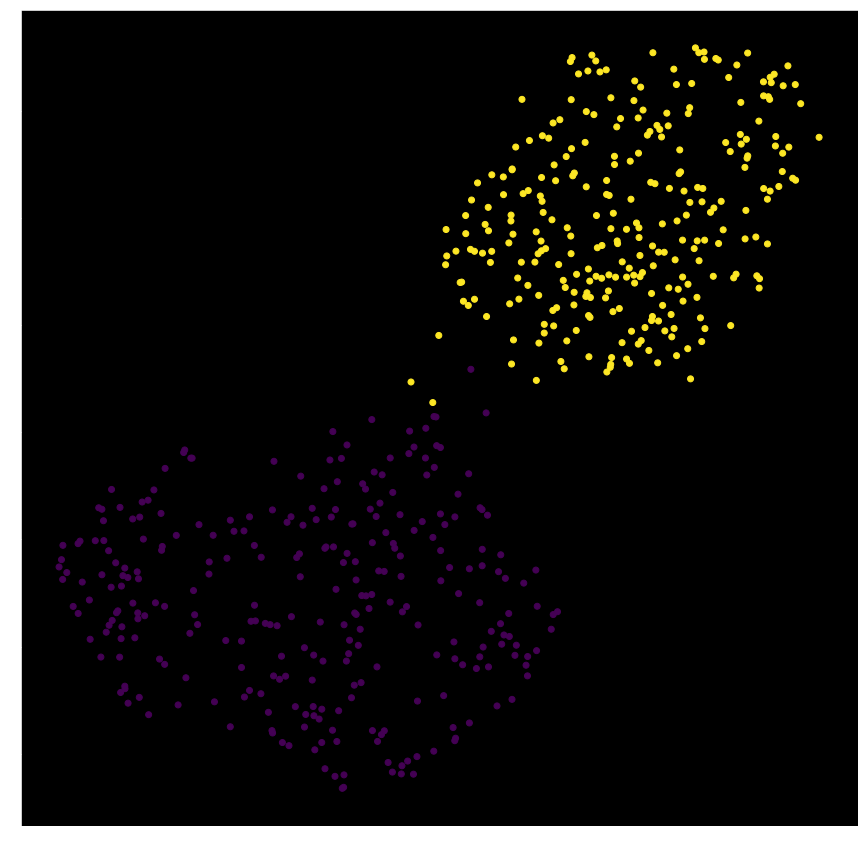

In [51]:
plt.figure(figsize=(15,15))
plt.scatter(embed[:,1],-embed[:,0],c=labels_train)

#### Canvas

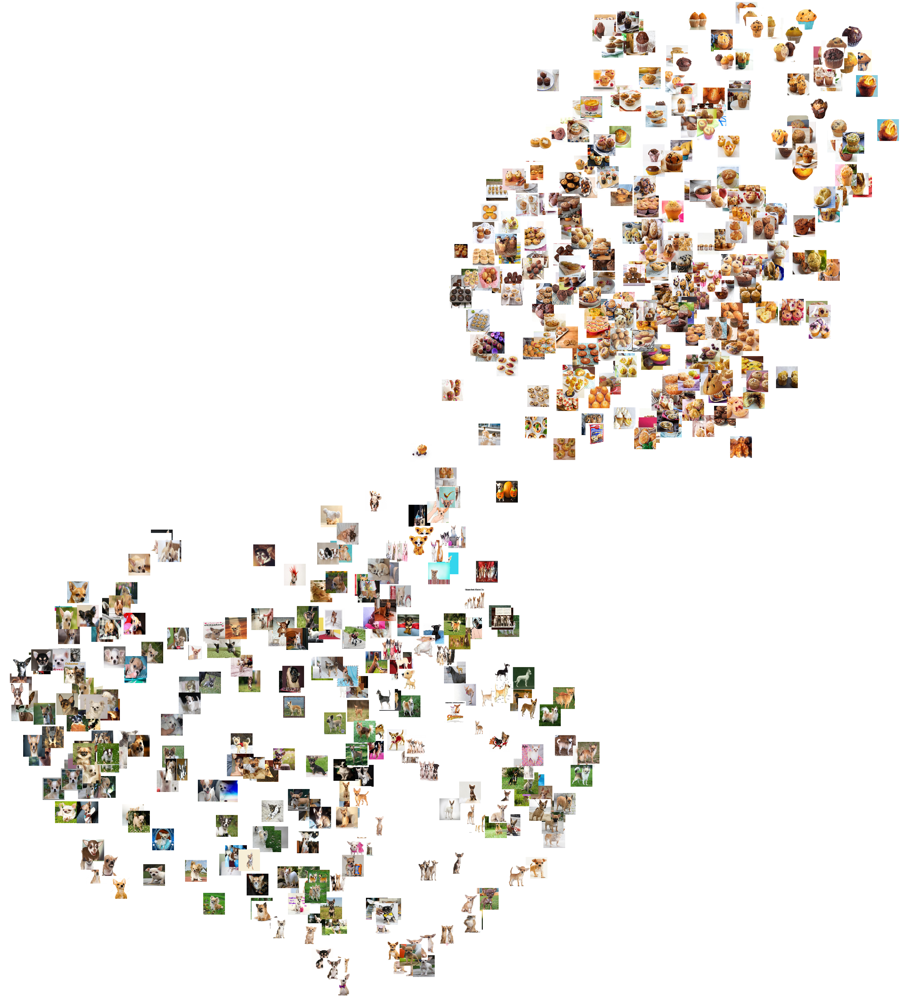

In [52]:
canvas = image_scatter(embed,datas_train,100)
plt.figure(figsize=(100,100))
plt.imshow(canvas)

### SVM Classification

In [53]:
from sklearn.svm import SVC

#### SVM Learning

In [ ]:
clf = SVC()
clf.fit(features_train,labels_train)

In [ ]:
print('Score= ',clf.score(features_train,labels_train)*100, '%')

### Validation dataset

In [ ]:
print('Score= ',clf.score(features_validation,labels_validation)*100, '%')

### Final Test

In [ ]:
print('Score= ',clf.score(features_test,labels_test)*100, '%')

In [ ]:
imshow(torchvision.utils.make_grid(torch.tensor(datas_test).permute(0,3,1,2),nrow=16),figsize=(28,15))
predicted = clf.predict(features_test)
print('   ', '     '.join('%5s' % classes[predicted[j]] for j in range(16)))